# **Course**: Deep Learning

[<img align="right" width="400" height="100" src="https://www.tu-braunschweig.de/typo3conf/ext/tu_braunschweig/Resources/Public/Images/Logos/tu_braunschweig_logo.svg">](https://www.tu-braunschweig.de/en/)

[Mehdi Maboudi](https://www.tu-braunschweig.de/en/igp/staff/mehdi-maboudi) \([m.maboudi@tu-bs.de](m.maboudi@tu-bs.de)) and [Pedro Achanccaray](https://www.tu-braunschweig.de/en/igp/staff/pedro-diaz) (p.diaz@tu-bs.de)

[Technical University of Braunschweig](https://www.tu-braunschweig.de/en/)  
[Institute of Geodesy and Photogrammetry](https://www.tu-braunschweig.de/igp)

# **Lab 01:** Working with remote sensing data

In this lab session, we will work with satellite data to cover the following topics:
- How to download satellite images?
- Visualization of satellite images
- Pansharpening
- Vegetation index calculation

## **Image acquisition**

Free satellite imagery can be obtained from the following sources:

|Name|Preview|
|:-:|:-:|
|[USGS Earth Explorer](https://earthexplorer.usgs.gov/)<br />(Landsat, MODIS, DEM, DTM,...)|<img src="https://drive.google.com/uc?export=view&id=1lonF2NpFunwsmMq30_evA6fdU74YJAh4" height=500/>|
|[Copernicus Open Access Hub](https://scihub.copernicus.eu/dhus/#/home)<br />(Sentinel missions: 1, 2, 3)|<img src="https://drive.google.com/uc?export=view&id=140eK9j1rArokS1hvJHR8SihnKV0vP-78" height=500/>|
|[NASA Earthdata Search](https://search.earthdata.nasa.gov/search)<br />(Landsat, Sentinel, ...)|<img src="https://drive.google.com/uc?export=view&id=1ZGGr4QQ8AHbhmjgfWyDmeMHIESDDxvYp" height=500/>|
|[DigitalGlobe Open Data Program](https://discover.maxar.com/)|<img src="https://drive.google.com/uc?export=view&id=16LDqm_LxIKSSfK3QIiZeh0o2_A9P-TW3" height=500/>|
|[National Institute for Space Research - INPE](http://www2.dgi.inpe.br/catalogo/explore)<br />(CBERS)|<img src="https://drive.google.com/uc?export=view&id=1Rl00v8p1d9s3NnVnKj9yaLEW_ZVgzr1q" height=500/>|
|[Bhuvan Indian Geo-Platform of ISRO](https://bhuvan-app3.nrsc.gov.in/data/download/index.php)<br />(Oceansat, Cartosat, SCATSAT, ...)|<img src="https://drive.google.com/uc?export=view&id=1p0kCJPCW4LQiog1HwBjy8GlDSiJ9cTck" height=500/>|
|[SCP Plugin for Quantum GIS](https://fromgistors.blogspot.com/p/semi-automatic-classification-plugin.html)<br /> (Landsat, Sentinel, ASTER, GOES, MODIS, ...)|<img src="https://drive.google.com/uc?export=view&id=16WxvNPESN3MQnpuq1B6dnvorzB1aHhRR" height=500/>|


## **APIs**

You can also use the official APIs to download images.

_The credentials required to use each API can be obtained in their respective websites._

**Landsat**
- Official: [Sentinel-Hub](https://github.com/sentinel-hub/sentinelhub-py)

**Sentinel**
- Official: [Machine-to-Machine (M2M)  API](https://m2m.cr.usgs.gov/api/docs/json/)
- Unofficial: [landsatxplore](https://github.com/yannforget/landsatxplore)


## **Mount Google Drive to Google Colab**

In [1]:
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

Change **this path** to the **path of a folder** in your Google Drive to storage the files associated to this session (trained model, figures for visualization, etc.)

In [2]:
# %cd drive/MyDrive/Colabs/DeepLearning_course/Lab_01

## **Load packages and data**

In [3]:
# Working with arrays
import numpy as np

# Working with images
import tifffile
import cv2

# Management of files
import os
from glob import glob
from os.path import join,exists,basename
from natsort import natsorted

# Visualization
import matplotlib.pyplot as plt

**Variables**

In [4]:
PROJECT_DIR = "." # os.getcwd()

**Getting the dataset**

First, we will download the data for this session from the given link.

For this, we will use **`wget`** and **`zipfile`** packages to download the zip file **`data_satellite.zip`** and to extract its content.

_In case of error during the download, you can download the dataset directly from [here](https://drive.google.com/file/d/1iejhegRmbUTuwOI9waK2UXpqP6Wx2Fox/view?usp=share_link)._



In [8]:
url_dataset = "https://drive.google.com/uc?export=download&confirm=yes&id=1iejhegRmbUTuwOI9waK2UXpqP6Wx2Fox"
filename = "data_satellite.zip"

# Check if the data has been already downloaded
if not exists("data"):
  # Install wget to download a file from a given url
  !pip install wget
  import wget
  f = wget.download(url_dataset, PROJECT_DIR)
  # Using zipfile to uncompress the file
  import zipfile
  with zipfile.ZipFile(filename, "r") as zip_ref:
    zip_ref.extractall(".")
  # Removing temporal files
  os.remove(filename)

Let's see the structure of the folder using the **`tree`** command:

The following commands are linux specific and won't work in window's environment. But can be ran in Google Colab

In [9]:
!apt-get install tree
!tree data --du -h

'apt-get' is not recognized as an internal or external command,
operable program or batch file.


Too many parameters - --du


Now, we can create a list with all available files for their better management.

In [10]:
path_landsat = join(PROJECT_DIR, "data", "landsat")

list_landsat_bands = glob(join(path_landsat,
                               "*.tif"))
list_landsat_bands = natsorted(list_landsat_bands, key=lambda y: y.lower())        # converted to lower case before sorting

print('\n'.join(str(x) for x in list_landsat_bands))

.\data\landsat\rj_nB1.tif
.\data\landsat\rj_nB2.tif
.\data\landsat\rj_nB3.tif
.\data\landsat\rj_nB4.tif
.\data\landsat\rj_nB5.tif
.\data\landsat\rj_nB6.tif
.\data\landsat\rj_nB7.tif
.\data\landsat\rj_nB8.tif


## **Visualization**

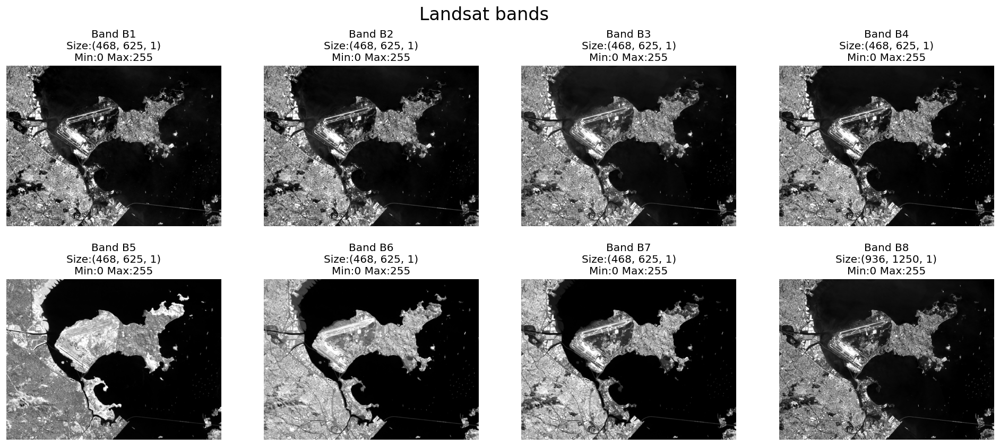

In [11]:
plt.figure(figsize=(20,8), dpi=120)
plt.suptitle("Landsat bands", fontsize=20)

for i,path_band in enumerate(list_landsat_bands):
  band = tifffile.imread(path_band)
  band_n = basename(path_band).split(".")[0][-2:]

  plt.subplot(2,4,i+1)
  plt.imshow(np.squeeze(band), cmap="gray")
  plt.title("Band {}\nSize:{}\nMin:{} Max:{}".format(band_n,
                                                     band.shape,
                                                     band.min(),
                                                     band.max()))
  plt.axis("off")
plt.show()

Landsat 8-9 Operational Land Imager (OLI) and Thermal Infrared Sensor (TIRS) [*bands*](https://www.usgs.gov/faqs/what-are-band-designations-landsat-satellites).

<center>

|Band|Wavelength ($μm$)|Resolution ($m$)|
|-----|:----------------:|:----------:|
| Band 1 - Coastal aerosol            | 0.43-0.45                | 30                  |
| **Band 2 - Blue**                       | 0.45-0.51                | 30                  |
| **Band 3 - Green**                      | 0.53-0.59                | 30                  |
| **Band 4 - Red**                        | 0.64-0.67                | 30                  |
| **Band 5 - Near Infrared (NIR)**        | 0.85-0.88                | 30                  |
| Band 6 - SWIR 1                     | 1.57-1.65                | 30                  |
| Band 7 - SWIR 2                     | 2.11-2.29                | 30                  |
| **Band 8 - Panchromatic**               | 0.50-0.68                | 15                  |
| Band 9 - Cirrus                     | 1.36-1.38                | 30                  |
| Band 10 - Thermal Infrared (TIRS) 1 | 10.6-11.19               | 100                 |
| Band 11 - Thermal Infrared (TIRS) 2 | 11.50-12.51              | 100                 |

</center>

**Folder structure:**
```
data
└── [3.1M]  landsat
    ├── [286K]  rj_nB1.tif
    ├── [286K]  rj_nB2.tif
    ├── [286K]  rj_nB3.tif
    ├── [286K]  rj_nB4.tif
    ├── [286K]  rj_nB5.tif
    ├── [286K]  rj_nB6.tif
    ├── [286K]  rj_nB7.tif
    └── [1.1M]  rj_nB8.tif
```



In [25]:
for path_band in list_landsat_bands:
  band = tifffile.imread(path_band)
  if "B2" in path_band:
    blue = band
  elif "B3" in path_band:
    green = band
  elif "B4" in path_band:
    red = band
  elif "B5" in path_band:
    nir = band
  elif "B8" in path_band:
    pan = band
  else:
    continue

**True and False Color RGB compositions**

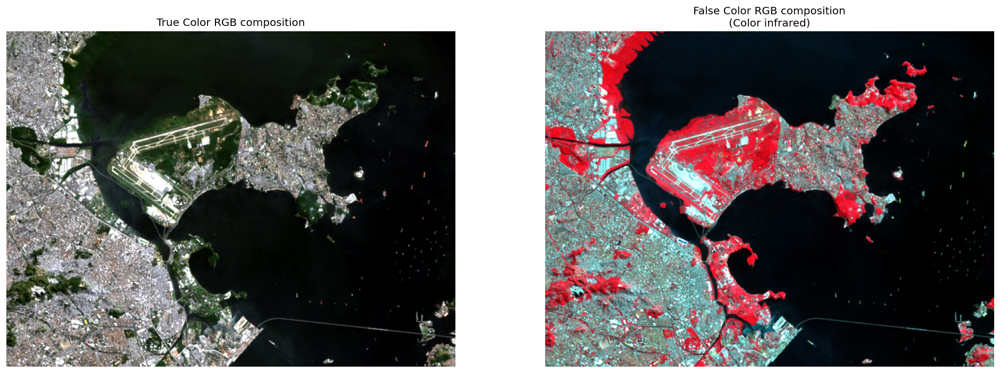

In [26]:
rgb = np.concatenate((red,green,blue), axis=2)
nirrg = np.concatenate((nir,red,green), axis=2)

plt.figure(figsize=(20,8), dpi=120)

plt.subplot(1,2,1)
plt.imshow(rgb)
plt.title("True Color RGB composition")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(nirrg)
plt.title("False Color RGB composition\n(Color infrared)")
plt.axis("off")

plt.show()

## **Pansharpening**

<center>
<img src="https://drive.google.com/uc?export=view&id=1eHw2Jco2aFE_Aj3jVYVRC-aiDbE1VuUk" height=400/>
</center>

For pansharpening, we will work with the following bands:
- Red
- Green
- Blue
- Panchromatic

In [27]:
print("Red: {}".format(red.shape))
print("Green: {}".format(green.shape))
print("Blue: {}".format(blue.shape))
print("NIR: {}".format(nir.shape))
print("PAN: {}".format(pan.shape))

Red: (468, 625, 1)
Green: (468, 625, 1)
Blue: (468, 625, 1)
NIR: (468, 625, 1)
PAN: (936, 1250, 1)


### **1. Convert RGB image to HSI**

We will use OpenCV to convert our **RGB** image to the **HSI** color space.

_HSI is not available in OpenCV. For that reason, we will use the HSV color space._

<center>
<img src="https://miro.medium.com/max/1400/1*W30TLUP9avQwyyLfwu7WYA.jpeg" height=250/>
</center>

In [28]:
hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)

Let's see how different are the **RGB** and **HSV** color spaces:

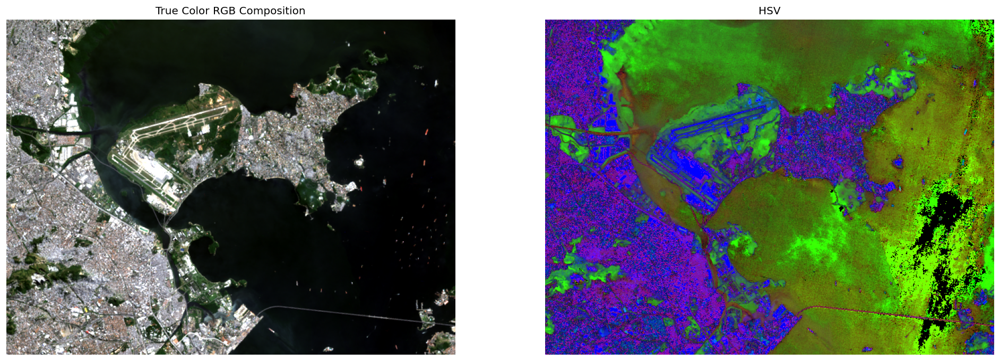

In [29]:
plt.figure(figsize=(20,8), dpi=120)

plt.subplot(1,2,1)
plt.imshow(rgb)
plt.axis('off')
plt.title("True Color RGB Composition")

plt.subplot(1,2,2)
plt.imshow(hsv)
plt.axis('off')
plt.title("HSV")

plt.show()

### **2. Resample HSI image to the same size of panchromatic band**

In [30]:
hsv_resized = cv2.resize(hsv, (pan.shape[1], pan.shape[0]))
print("HSV: {}".format(hsv.shape))
print("HSV resized: {}".format(hsv_resized.shape))
print("PAN: {}".format(pan.shape))

HSV: (468, 625, 3)
HSV resized: (936, 1250, 3)
PAN: (936, 1250, 1)


### **3. Substitute intensity (I) band from HSI image by the panchromatic band**

In [31]:
hsv_resized[...,2] = pan[:,:,0] # hsv_resized[:,:,2]
# [...,j] = [:,:,:,:,:,j]

### **4. Convert HSI image to RGB**

In [32]:
pansharpened = cv2.cvtColor(hsv_resized, cv2.COLOR_HSV2RGB)

Let's compare the True Color RGB composition with the Pansharpened image

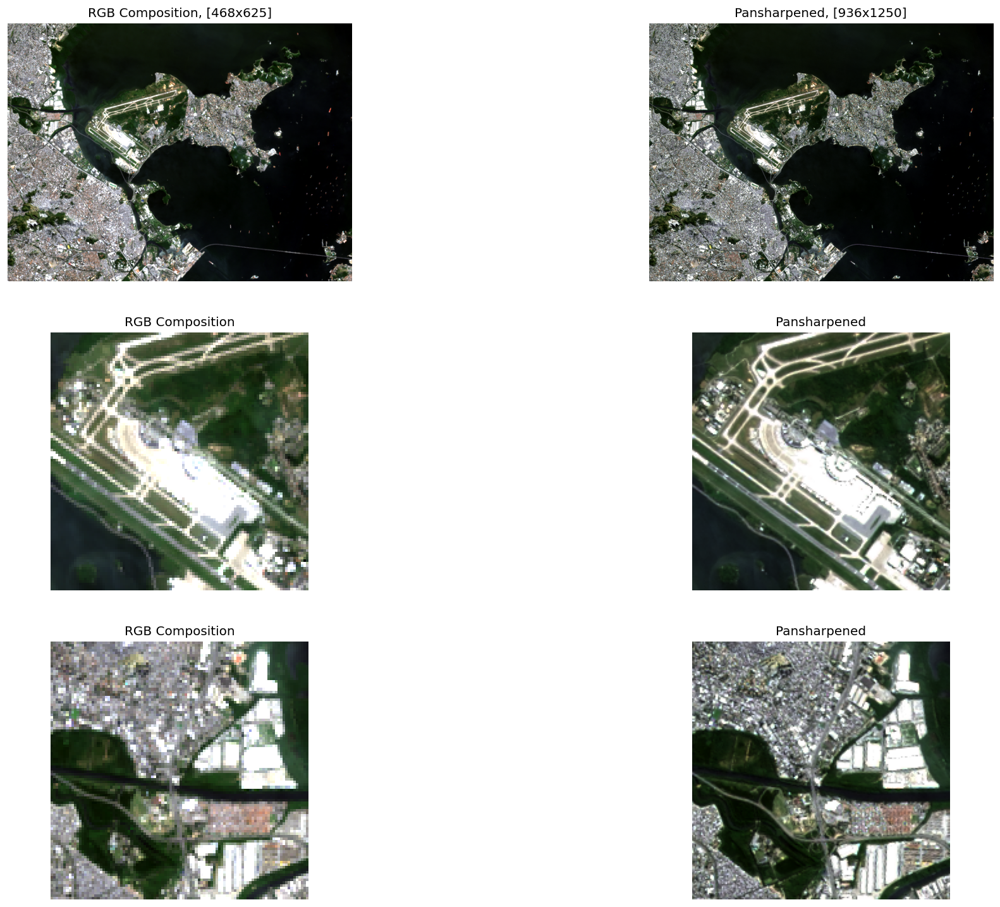

In [33]:
plt.figure(figsize=(20,15), dpi=120)

plt.subplot(3,2,1)
plt.imshow(rgb)
plt.axis('off')
plt.title("RGB Composition, [{}x{}]".format(rgb.shape[0],
                                            rgb.shape[1]))

plt.subplot(3,2,2)
plt.imshow(pansharpened)
plt.axis('off')
plt.title("Pansharpened, [{}x{}]".format(pansharpened.shape[0],
                                         pansharpened.shape[1]))

plt.subplot(3,2,3)
plt.imshow(rgb[150:250,150:250,:])
plt.axis('off')
plt.title("RGB Composition")

plt.subplot(3,2,4)
plt.imshow(pansharpened[300:500,300:500,:])
plt.axis('off')
plt.title("Pansharpened")

plt.subplot(3,2,5)
plt.imshow(rgb[100:200,10:110,:])
plt.axis('off')
plt.title("RGB Composition")

plt.subplot(3,2,6)
plt.imshow(pansharpened[200:400,20:220,:])
plt.axis('off')
plt.title("Pansharpened")

plt.show()

## **Vegetation index calculation**

Now we can calculate a vegetation index to see the status of areas with vegetation (grass, crops, trees, etc.)

We will use the **Normalized Difference Vegetation Index (NDVI)** for this purpose:

<center>
$NDVI=\frac{NIR-RED}{NIR+RED}$
</center>
</br>
</br>

<center>
<img src="https://static.eos.com/wp-content/uploads/2020/07/plants.jpg" height=300/>
</center>


C:\Users\Sara\AppData\Local\Temp\ipykernel_17112\1776920614.py:1: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir.astype(float) - red.astype(float)) / (nir.astype(float) + red.astype(float))


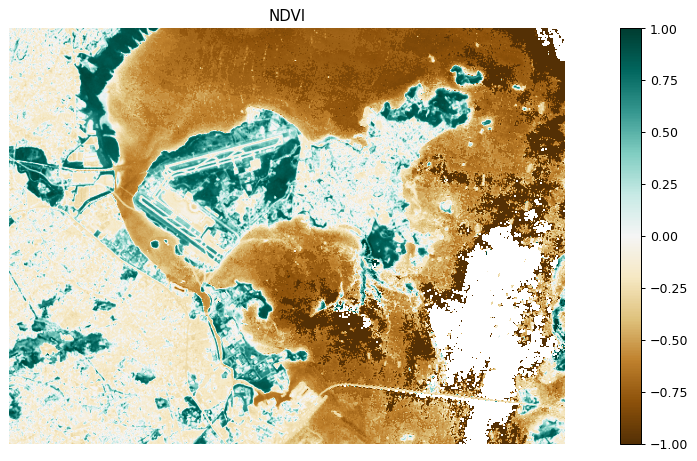

In [34]:
ndvi = (nir.astype(float) - red.astype(float)) / (nir.astype(float) + red.astype(float))

plt.figure(figsize=(16,6), dpi=90)

plt.imshow(np.squeeze(ndvi), cmap='BrBG')
plt.colorbar()
plt.axis('off')
plt.title("NDVI")

plt.show()

**Masking using NDVI**

In [35]:
ndvi_threshold = 0.1
rgb_veg = rgb.copy()
rgb_veg[np.squeeze(ndvi) < ndvi_threshold] = 0

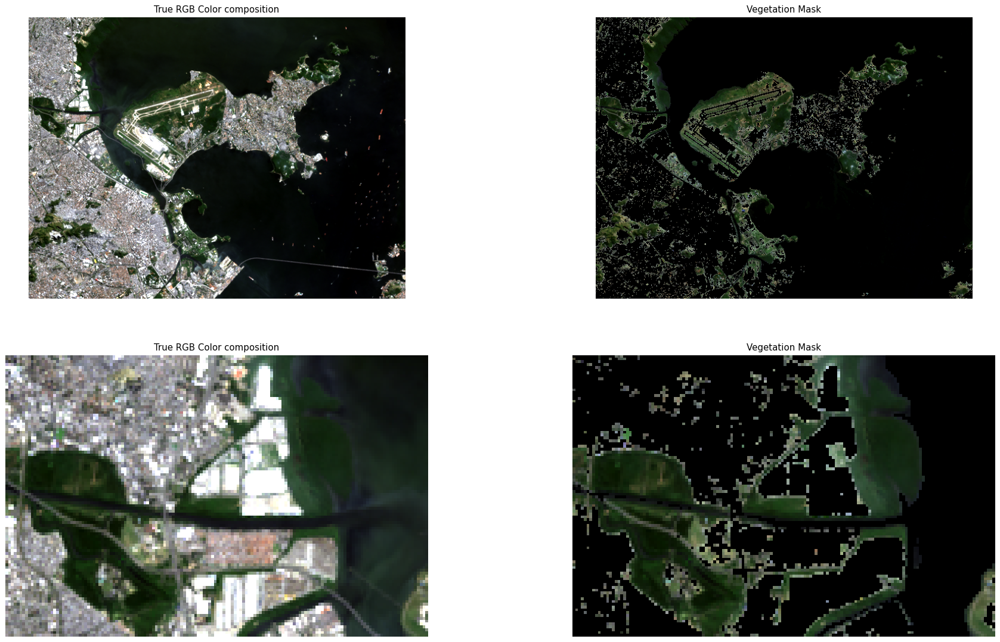

In [36]:
plt.figure(figsize=(25,15), dpi=90)

plt.subplot(2,2,1)
plt.imshow(rgb)
plt.axis('off')
plt.title("True RGB Color composition")

plt.subplot(2,2,2)
plt.imshow(rgb_veg)
plt.axis('off')
plt.title("Vegetation Mask")

plt.subplot(2,2,3)
plt.imshow(rgb[100:200,:150,:])
plt.axis('off')
plt.title("True RGB Color composition")

plt.subplot(2,2,4)
plt.imshow(rgb_veg[100:200,:150,:])
plt.axis('off')
plt.title("Vegetation Mask")

plt.show()

**Vegetation area**

We can compute the vegetation areas based on the spatial resolution and the number of pixels:

<center>
$Area_{Vegetation}=sr\cdot sr\cdot N_{pixels}$
</center>

where $sr$ is the spatial resolution and $N_{pixels}$ is the number of pixels.

In [37]:
non_zero = np.sum(rgb_veg[...,0] != 0)
total_area = non_zero * 30 * 30 * 1e-6

print("Vegetation area: {:0.2f} Km\N{SUPERSCRIPT TWO}".format(total_area))

Vegetation area: 52.64 Km²
